In [1]:
# VAE Visualization and Evaluation

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.manifold import TSNE
import random

# --- Settings ---
img_size = 224
batch_size = 16  # Smaller batch for visualization
latent_dim = 128
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# --- Custom Dataset for Unlabeled Images ---
class ImageDataset():
    def __init__(self, root, transform=None):
        self.files = [os.path.join(root, f) for f in os.listdir(root) if f.lower().endswith(('.jpg', '.png'))]
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, os.path.basename(self.files[idx])  # Return filename for reference

# --- VAE Architecture (same as in your training script) ---
class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 4, 2, 1),   # [B, 32, 112, 112]
            nn.ReLU(),
            nn.Conv2d(32, 64, 4, 2, 1),  # [B, 64, 56, 56]
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, 2, 1), # [B, 128, 28, 28]
            nn.ReLU(),
            nn.Flatten()
        )

        self.fc_mu = nn.Linear(128 * 28 * 28, latent_dim)
        self.fc_logvar = nn.Linear(128 * 28 * 28, latent_dim)
        self.fc_decode = nn.Linear(latent_dim, 128 * 28 * 28)

        self.decoder = nn.Sequential(
            nn.Unflatten(1, (128, 28, 28)),
            nn.ConvTranspose2d(128, 64, 4, 2, 1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, 2, 1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, 4, 2, 1),
            nn.Tanh()
        )

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def encode(self, x):
        x_enc = self.encoder(x)
        mu = self.fc_mu(x_enc)
        logvar = self.fc_logvar(x_enc)
        return mu, logvar

    def decode(self, z):
        x_dec = self.fc_decode(z)
        x_recon = self.decoder(x_dec)
        return x_recon

    def forward(self, x):
        x_enc = self.encoder(x)
        mu = self.fc_mu(x_enc)
        logvar = self.fc_logvar(x_enc)
        z = self.reparameterize(mu, logvar)
        x_dec = self.fc_decode(z)
        x_recon = self.decoder(x_dec)
        return x_recon, mu, logvar

# --- Helper Functions ---

def load_model(model_path):
    """Load the trained VAE model"""
    model = VAE(latent_dim).to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()
    return model

def tensor_to_image(tensor):
    """Convert a tensor to numpy image for display"""
    img = tensor.clone().detach().cpu()
    img = img.squeeze(0) if img.dim() == 4 else img
    # Denormalize from [-1,1] to [0,1]
    img = (img + 1) / 2.0
    img = img.clamp(0, 1)
    img = img.permute(1, 2, 0).numpy()
    return img

def show_image_grid(images, titles=None, cols=4, figsize=(15, 15)):
    """Display a grid of images"""
    rows = (len(images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=figsize)

    # Make axes a 2D array regardless of shape
    if rows == 1 and cols == 1:
        axes = np.array([[axes]])
    elif rows == 1 or cols == 1:
        axes = axes.reshape(rows, cols)

    for i, (ax, img) in enumerate(zip(axes.flatten(), images)):
        if i < len(images):
            ax.imshow(img)
            if titles is not None and i < len(titles):
                ax.set_title(titles[i])
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# --- Data Loading ---

# Update with your image folder path
data_dir = "E:/Datasets/masati-thesis/augmented-images"  # Replace with your actual path

# Transformations
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])  # [-1, 1] range
])

# Load dataset and dataloader
dataset = ImageDataset(data_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)

# --- Load Model ---
# Replace with your model path
model_path = "../models/vae_model.pth"  # Update this if your model is saved elsewhere
vae = load_model(model_path)

# --- Visualization Functions ---

def generate_random_samples(model, n_samples=16):
    """Generate random samples from the latent space"""
    with torch.no_grad():
        # Sample random latent vectors
        z = torch.randn(n_samples, latent_dim).to(device)
        # Decode the latent vectors
        samples = model.decode(z)

    # Convert to displayable images
    sample_images = [tensor_to_image(samples[i]) for i in range(n_samples)]

    # Display
    show_image_grid(sample_images, titles=[f"Sample {i+1}" for i in range(n_samples)])

    return samples

def reconstruct_images(model, dataloader, n_samples=8):
    """Reconstruct images from the dataset"""
    # Get a batch of images
    with torch.no_grad():
        imgs, filenames = next(iter(dataloader))
        imgs = imgs.to(device)

        # Reconstruct
        recon, _, _ = model(imgs)

        # Keep only n_samples
        imgs = imgs[:n_samples]
        recon = recon[:n_samples]
        filenames = filenames[:n_samples]

    # Convert to displayable images
    original_images = [tensor_to_image(imgs[i]) for i in range(len(imgs))]
    recon_images = [tensor_to_image(recon[i]) for i in range(len(recon))]

    # Display originals
    show_image_grid(original_images, titles=[f"Original: {name}" for name in filenames])

    # Display reconstructions
    show_image_grid(recon_images, titles=[f"Reconstruction: {name}" for name in filenames])

    return imgs, recon

def visualize_latent_space(model, dataloader, n_samples=200):
    """Project the latent space to 2D using t-SNE"""
    latent_vectors = []
    image_tensors = []
    filenames = []

    # Get latent vectors for a subset of images
    with torch.no_grad():
        for imgs, fnames in dataloader:
            if len(latent_vectors) >= n_samples:
                break

            imgs = imgs.to(device)
            mu, _ = model.encode(imgs)

            latent_vectors.append(mu.cpu().numpy())
            image_tensors.append(imgs.cpu())
            filenames.extend(fnames)

            if len(latent_vectors) >= n_samples:
                break

    # Concatenate all latent vectors
    latent_vectors = np.vstack(latent_vectors)[:n_samples]

    # Use t-SNE to reduce to 2D
    print("Performing t-SNE dimensionality reduction...")
    tsne = TSNE(n_components=2, random_state=42)
    latent_2d = tsne.fit_transform(latent_vectors)

    # Plot the results
    plt.figure(figsize=(12, 10))
    plt.scatter(latent_2d[:, 0], latent_2d[:, 1], alpha=0.7, s=10)
    plt.title('t-SNE visualization of latent space')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.show()

    # Pick some random points and show the corresponding images
    if len(image_tensors) > 0:
        all_images = torch.cat(image_tensors, dim=0)[:n_samples]

        # Select 16 random indices
        selected_indices = random.sample(range(len(latent_2d)), min(16, len(latent_2d)))

        # Get images
        selected_images = [tensor_to_image(all_images[i]) for i in selected_indices]
        selected_titles = [f"Point {i}: {filenames[i]}" for i in selected_indices]

        # Plot points on t-SNE
        plt.figure(figsize=(12, 10))
        plt.scatter(latent_2d[:, 0], latent_2d[:, 1], alpha=0.5, s=10, c='blue')
        plt.scatter(latent_2d[selected_indices, 0], latent_2d[selected_indices, 1],
                    alpha=1.0, s=50, c='red')
        plt.title('Selected points in latent space')
        plt.xlabel('Dimension 1')
        plt.ylabel('Dimension 2')
        for i, idx in enumerate(selected_indices):
            plt.annotate(str(i), (latent_2d[idx, 0], latent_2d[idx, 1]))
        plt.show()

        # Show selected images
        show_image_grid(selected_images, titles=selected_titles)

    return latent_2d

def interpolate_latent_vectors(model, dataloader, n_steps=10):
    """Interpolate between two images in the latent space"""
    # Get two random images
    with torch.no_grad():
        imgs, filenames = next(iter(dataloader))
        imgs = imgs.to(device)

        # Encode to get latent vectors
        mu, _ = model.encode(imgs)

        # Select two latent vectors
        z1, z2 = mu[0].unsqueeze(0), mu[1].unsqueeze(0)

        # Interpolate
        alphas = torch.linspace(0, 1, n_steps)
        interpolated_images = []

        for alpha in alphas:
            # Linear interpolation: z = (1-α)z₁ + αz₂
            z_interp = (1-alpha) * z1 + alpha * z2
            # Decode
            img_interp = model.decode(z_interp)
            interpolated_images.append(tensor_to_image(img_interp))

    # Show original images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(tensor_to_image(imgs[0]))
    plt.title(f"Start: {filenames[0]}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(tensor_to_image(imgs[1]))
    plt.title(f"End: {filenames[1]}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Show interpolation
    show_image_grid(interpolated_images,
                   titles=[f"Step {i+1}/{n_steps}" for i in range(n_steps)],
                   cols=5)

    return interpolated_images

# --- Analyze Reconstruction Quality ---
def compute_reconstruction_metrics(model, dataloader, n_batches=10):
    """Compute MSE between original and reconstructed images"""
    mse_values = []

    with torch.no_grad():
        for i, (imgs, _) in enumerate(dataloader):
            if i >= n_batches:
                break

            imgs = imgs.to(device)
            recon, _, _ = model(imgs)

            # Compute MSE for each image in batch
            for j in range(len(imgs)):
                mse = F.mse_loss(recon[j], imgs[j]).item()
                mse_values.append(mse)

    # Plot histogram of MSE values
    plt.figure(figsize=(10, 6))
    plt.hist(mse_values, bins=30)
    plt.title('Distribution of Reconstruction MSE')
    plt.xlabel('MSE Value')
    plt.ylabel('Frequency')
    plt.show()

    print(f"Average MSE: {np.mean(mse_values):.6f}")
    print(f"Median MSE: {np.median(mse_values):.6f}")
    print(f"Min MSE: {np.min(mse_values):.6f}")
    print(f"Max MSE: {np.max(mse_values):.6f}")

    return mse_values

# --- Latent Space Arithmetic ---
def latent_space_arithmetic(model, dataloader):
    """Perform vector arithmetic in the latent space"""
    # Get a batch of images
    with torch.no_grad():
        imgs, filenames = next(iter(dataloader))
        imgs = imgs.to(device)

        # Encode to get latent vectors
        mu, _ = model.encode(imgs)

        # Select three images for arithmetic
        z1, z2, z3 = mu[0], mu[1], mu[2]

        # Perform arithmetic: z_result = z3 + (z2 - z1)
        z_result = z3 + (z2 - z1)

        # Decode the result
        img_result = model.decode(z_result.unsqueeze(0))

    # Display the original images and the result
    plt.figure(figsize=(15, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(tensor_to_image(imgs[0]))
    plt.title(f"Image 1: {filenames[0]}")
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(tensor_to_image(imgs[1]))
    plt.title(f"Image 2: {filenames[1]}")
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(tensor_to_image(imgs[2]))
    plt.title(f"Image 3: {filenames[2]}")
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(tensor_to_image(img_result[0]))
    plt.title("Result: Image 3 + (Image 2 - Image 1)")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return img_result

Using device: cuda


Generating random samples from the latent space...


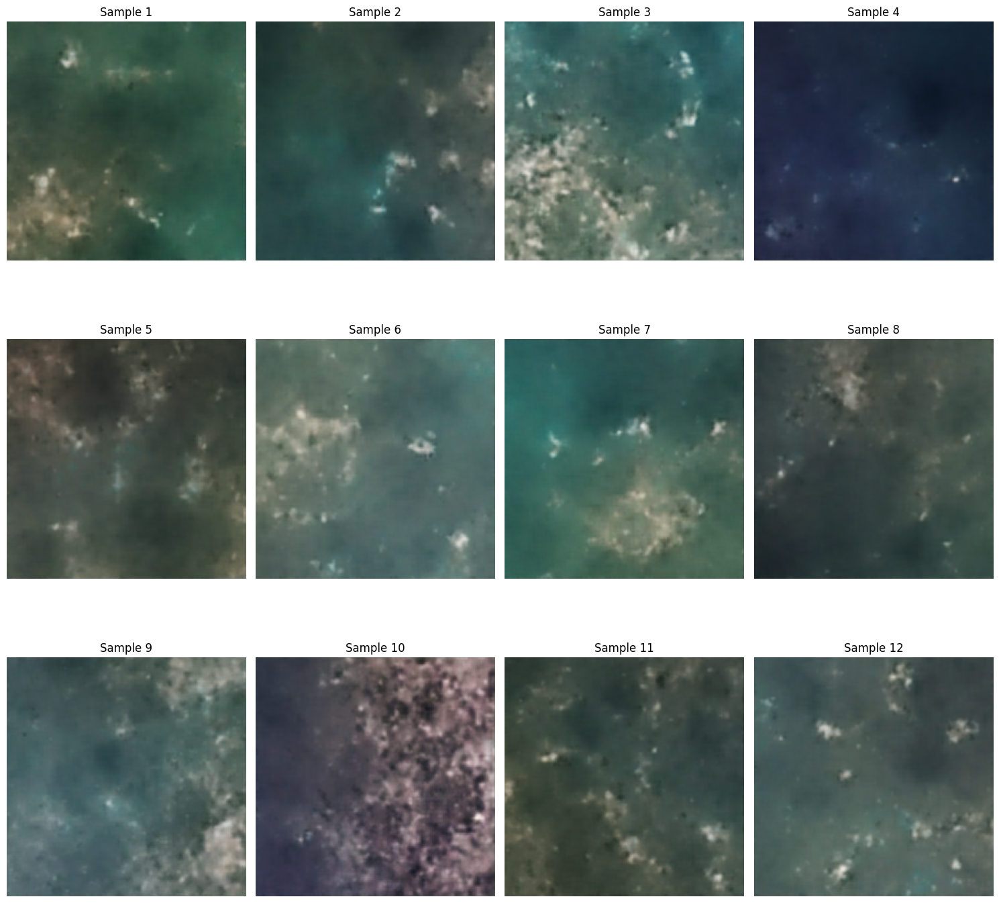

In [2]:
# 1. Generate random samples from the latent space
print("Generating random samples from the latent space...")
random_samples = generate_random_samples(vae, n_samples=12)


Reconstructing images from the dataset...


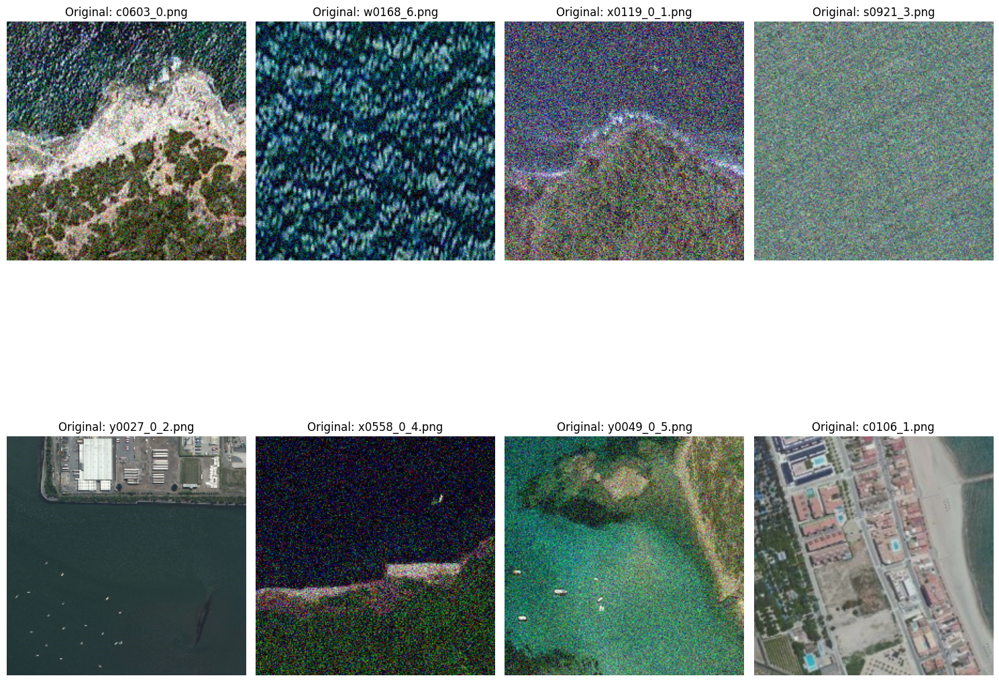

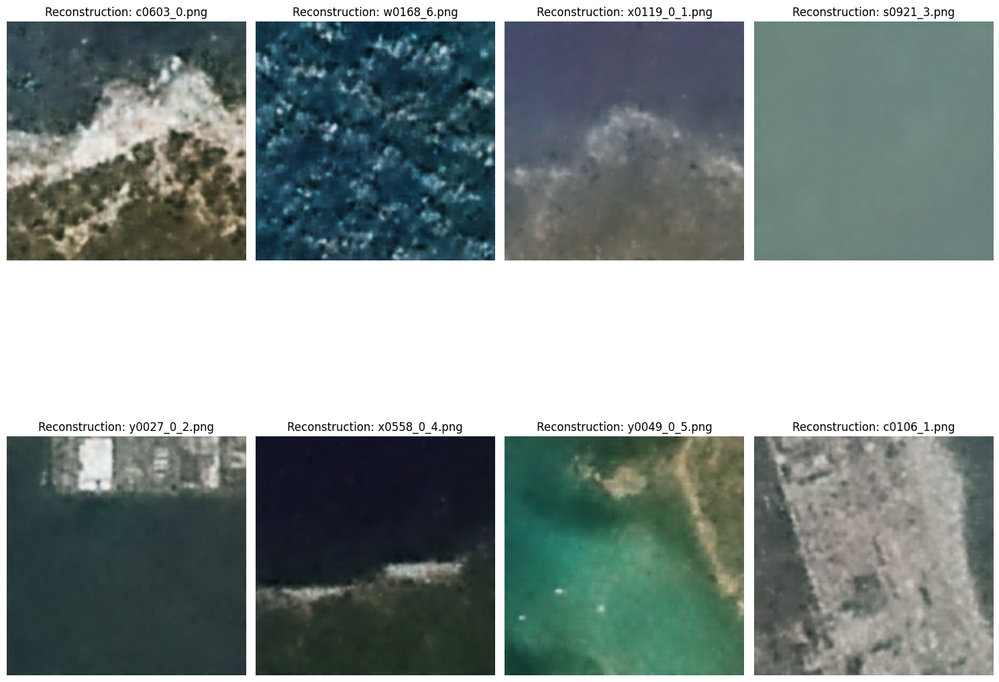

In [2]:
# 2. Reconstruct images from the dataset
print("\nReconstructing images from the dataset...")
original, reconstructed = reconstruct_images(vae, dataloader, n_samples=8)


Computing reconstruction metrics...


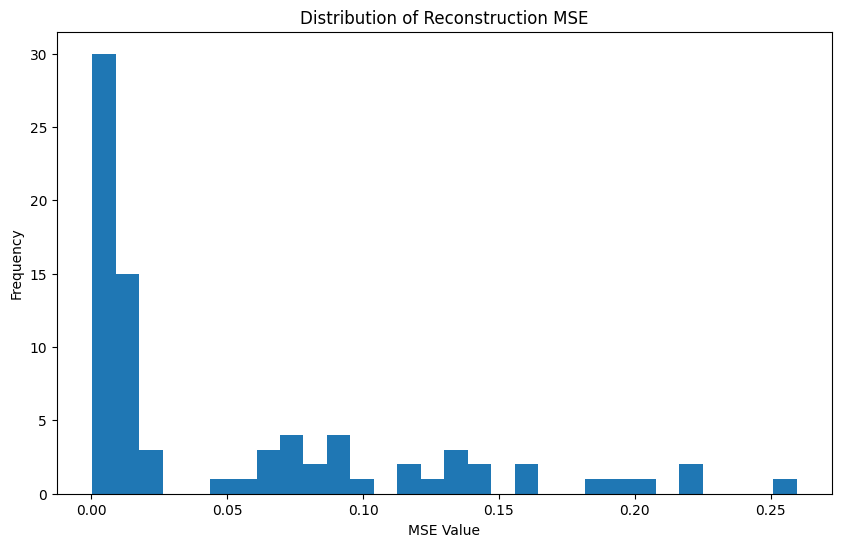

Average MSE: 0.052935
Median MSE: 0.014297
Min MSE: 0.000330
Max MSE: 0.259550


In [3]:
# 3. Compute reconstruction quality metrics
print("\nComputing reconstruction metrics...")
mse_values = compute_reconstruction_metrics(vae, dataloader, n_batches=5)


Visualizing the latent space...
Performing t-SNE dimensionality reduction...


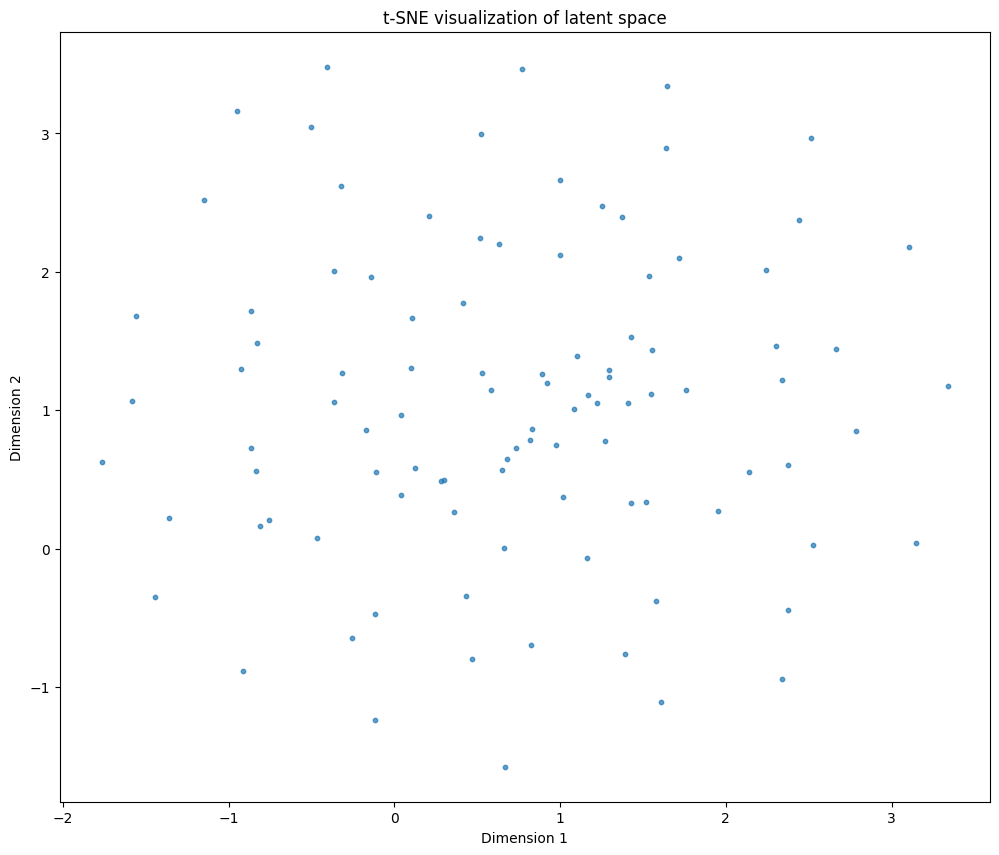

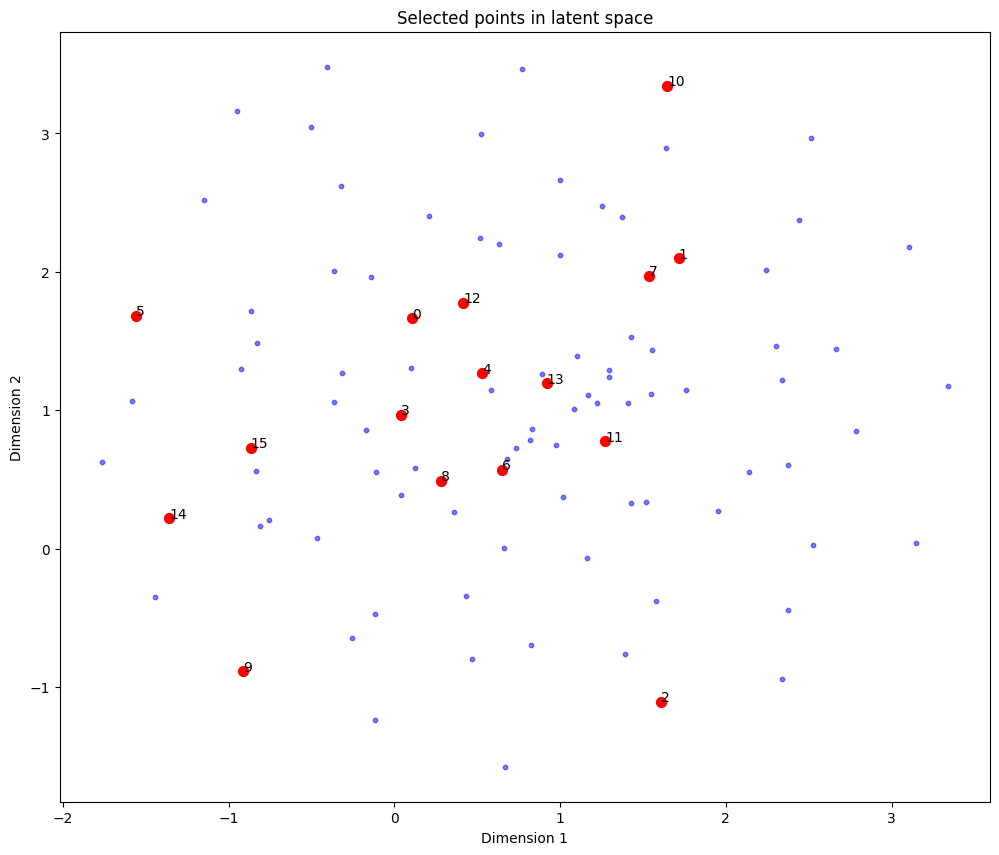

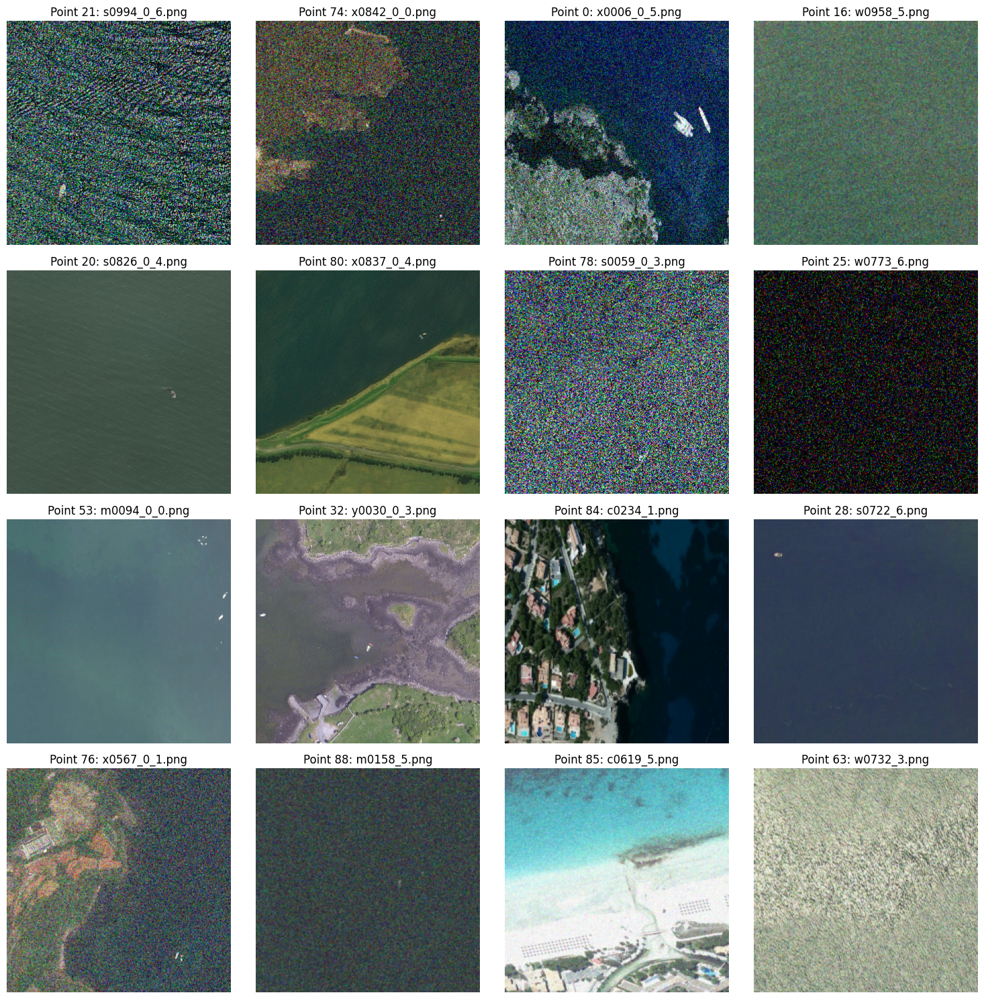

In [4]:
# 4. Visualize the latent space using t-SNE
print("\nVisualizing the latent space...")
latent_2d = visualize_latent_space(vae, dataloader, n_samples=100)



Interpolating between images in the latent space...


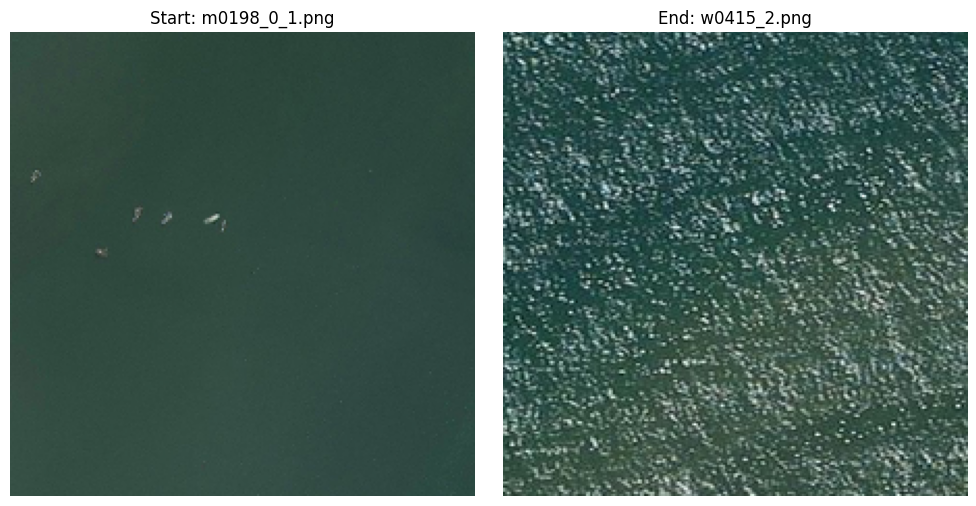

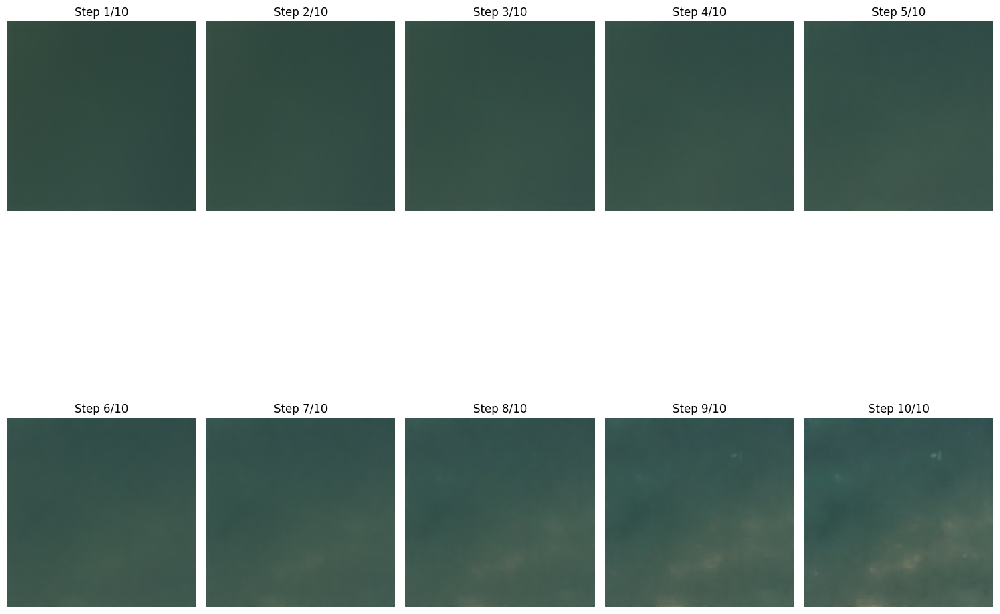

In [5]:
# 5. Create interpolations between images in the latent space
print("\nInterpolating between images in the latent space...")
interpolations = interpolate_latent_vectors(vae, dataloader, n_steps=10)


Performing latent space arithmetic...


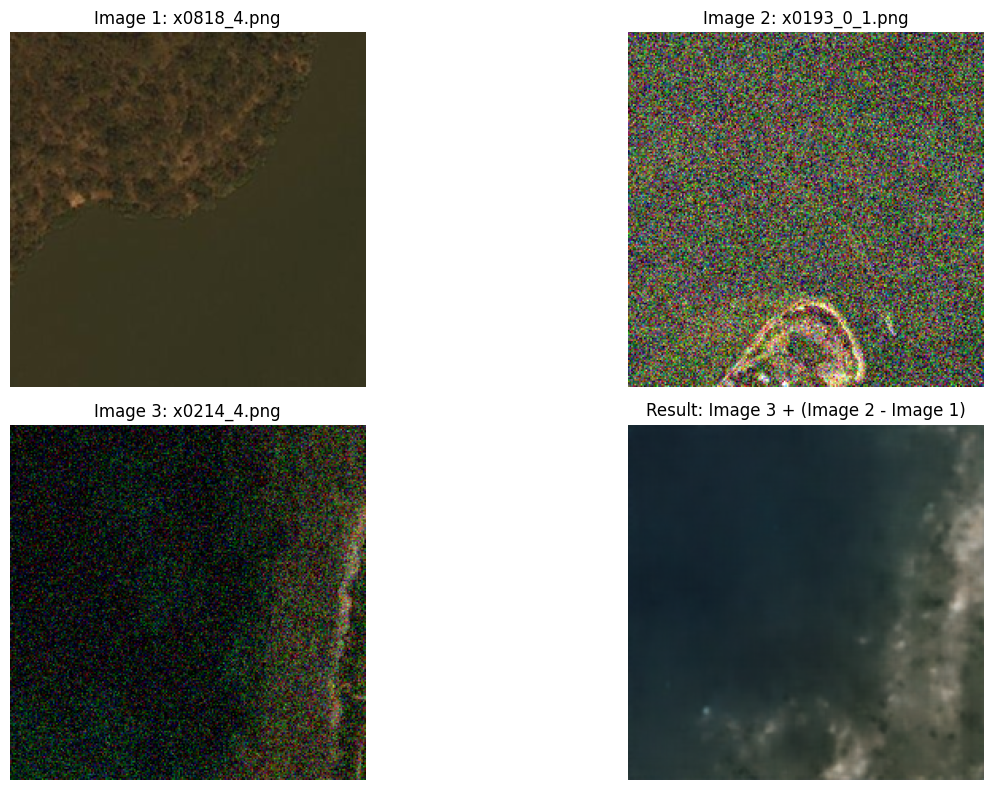


Visualization complete!


In [6]:
# 6. Perform latent space arithmetic
print("\nPerforming latent space arithmetic...")
arithmetic_result = latent_space_arithmetic(vae, dataloader)
print("\nVisualization complete!")